# Spatial Data Exploration

Sourced city boundary data from https../../data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-City-Map/ewy2-6yfk
Sourced census tract data from https../../data.cityofchicago.org/Facilities-Geographic-Boundaries/Census_Tracts/4hp8-2i8z
Sourced community area data from https../../data.cityofchicago.org/Facilities-Geographic-Boundaries/Boundaries-Community-Areas-Map/cauq-8yn6

Downloaded all data as .geojson file. Saved data can be found in "../../data/..."

# Imports

In [2]:
# Imports
import geopandas as gpd
import matplotlib.pyplot as plt
import h3
import json
import pandas as pd
from shapely.geometry import shape
import contextily as ctx


# Constants
H3_HEXAGON_RESOLUTION = 7
BOUNDARIES_DATA_PATH = '../../data/chicago_boundaries.geojson'
TAXI_DATA_PATH = '../../data/chicago_taxi_2024_2026_clean.parquet'
CENSUS_TRACT_DATA_PATH = '../../data/census_tracts_chicago.geojson'
COMMUNITY_AREA_DATA_PATH = '../../data/community_areas_chicago.geojson'

# Only load the columns this notebook actually uses -- the parquet now holds
# 14M+ rows across 2024-2026, so loading all 27 columns wastes a lot of memory
TAXI_DATA_COLUMNS = [
    'trip_start_timestamp', 'trip_end_timestamp',
    'pickup_census_tract', 'dropoff_census_tract',
    'pickup_centroid_latitude', 'pickup_centroid_longitude',
    'dropoff_centroid_latitude', 'dropoff_centroid_longitude',
]

In [3]:
# Reusable helpers for the 4-hourly breakdowns below. Both expect the
# h3/spatial-join columns to already exist on the full dataset (computed once,
# upstream) so they only slice by hour and aggregate.

TIME_BINS = [(0, 4), (4, 8), (8, 12), (12, 16), (16, 20), (20, 24)]
TIME_LABELS = ['0:00-4:00', '4:00-8:00', '8:00-12:00', '12:00-16:00', '16:00-20:00', '20:00-24:00']


def plot_hourly_hex_counts(gdf, hex_boundaries, timestamp_col, title_prefix):
    hour = gdf[timestamp_col].dt.hour

    # Build all six frames first so every panel can share one 0-to-max color
    # scale -- otherwise each panel auto-scales to its own max and the colors
    # aren't comparable across time bins.
    frames = []
    for start, end in TIME_BINS:
        counts = gdf.loc[(hour >= start) & (hour < end)].groupby('h3_hex_id').size().reset_index(name='count')
        frame = hex_boundaries.merge(counts, on='h3_hex_id', how='left')
        frame['count'] = frame['count'].fillna(0)
        frames.append(frame.to_crs(epsg=3857))

    vmax = max(frame_web['count'].max() for frame_web in frames)

    fig, axes = plt.subplots(3, 2, figsize=(14, 20), dpi=80)
    for ax, frame_web, label in zip(axes.flat, frames, TIME_LABELS):
        frame_web.plot(ax=ax, column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax,
                        edgecolor='black', linewidth=0.5, alpha=0.7, zorder=1)
        ctx.add_basemap(ax, crs=frame_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
        ax.set_title(f'{title_prefix} by Hexagon (Resolution {H3_HEXAGON_RESOLUTION}) ({label})', fontsize=14)
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)


def plot_hourly_join_counts(joined_gdf, boundaries, timestamp_col, title_prefix, level_name):
    boundaries_indexed = boundaries.reset_index()
    hour = joined_gdf[timestamp_col].dt.hour

    # Build all six frames first so every panel can share one 0-to-max color
    # scale -- otherwise each panel auto-scales to its own max and the colors
    # aren't comparable across time bins.
    frames = []
    for start, end in TIME_BINS:
        counts = joined_gdf.loc[(hour >= start) & (hour < end)].groupby('index_right').size().reset_index(name='count')
        frame = boundaries_indexed.merge(counts, left_on='index', right_on='index_right', how='left')
        frame['count'] = frame['count'].fillna(0)
        frames.append(frame.to_crs(epsg=3857))

    vmax = max(frame_web['count'].max() for frame_web in frames)

    fig, axes = plt.subplots(3, 2, figsize=(14, 20), dpi=80)
    for ax, frame_web, label in zip(axes.flat, frames, TIME_LABELS):
        frame_web.plot(ax=ax, column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax,
                        edgecolor='black', linewidth=0.5, alpha=0.7, zorder=1)
        ctx.add_basemap(ax, crs=frame_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
        ax.set_title(f'{title_prefix} by {level_name} ({label})', fontsize=14)
        ax.axis('off')

    plt.tight_layout()
    plt.show()
    plt.close(fig)

### City boundaries

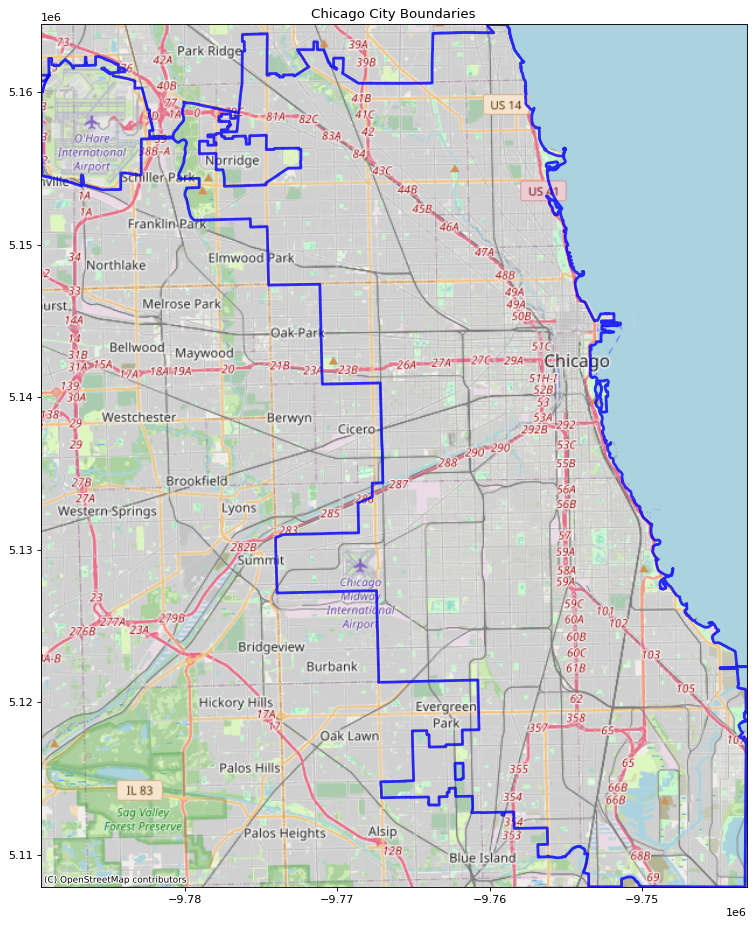

In [4]:
city = gpd.read_file(BOUNDARIES_DATA_PATH)
city_geo = city.geometry

fig, ax = plt.subplots(figsize=(14, 14), dpi=80)

# Convert to Web Mercator
city_bounds = gpd.GeoDataFrame(geometry=city_geo, crs='EPSG:4326').to_crs(epsg=3857)

# Plot first (so the extent exists)
city_bounds.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=2.5, alpha=0.8)

# Set extent for contextily
ax.set_xlim(city_bounds.total_bounds[0], city_bounds.total_bounds[2])
ax.set_ylim(city_bounds.total_bounds[1], city_bounds.total_bounds[3])

# Add basemap
ctx.add_basemap(ax, crs=city_bounds.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title('Chicago City Boundaries')
plt.show()
plt.close(fig)

# Taxi Trip data

### Data loading and separation

In [5]:
taxi_data = pd.read_parquet(TAXI_DATA_PATH, columns=TAXI_DATA_COLUMNS)
taxi_data.head()

# Only keep columns with filled out census tract info for census tract visualization
taxi_data_cs = taxi_data.dropna(subset=['pickup_census_tract', 'dropoff_census_tract'])

In [6]:
# Complete taxi data with resolution on community area and census tract level
taxi_data.count()

trip_start_timestamp          14465662
trip_end_timestamp            14465662
pickup_census_tract            6453143
dropoff_census_tract           6258245
pickup_centroid_latitude      14203555
pickup_centroid_longitude     14203555
dropoff_centroid_latitude     13324248
dropoff_centroid_longitude    13324248
dtype: int64

In [7]:
# Filtered taxi data with resolution on census tract level
taxi_data_cs.count()

trip_start_timestamp          6245422
trip_end_timestamp            6245422
pickup_census_tract           6245422
dropoff_census_tract          6245422
pickup_centroid_latitude      6245280
pickup_centroid_longitude     6245280
dropoff_centroid_latitude     6230917
dropoff_centroid_longitude    6230917
dtype: int64

### Spatial data coverage and interpretation

The spatial views do not use the same number of trips. Coordinate maps cover almost all pickups and most drop-offs, whereas the Census Tract maps retain only trips for which **both** tract identifiers are available. The exact coverage is reported below.

The coordinates are anonymized reporting centroids, not exact trip locations. More than 14 million trips collapse to only 573 distinct pickup-coordinate pairs and 687 drop-off-coordinate pairs. The maps must therefore be interpreted as demand assigned to reporting locations rather than street-level point density.

In [ ]:
spatial_availability = pd.DataFrame({"Available Records": [len(taxi_data), taxi_data[["pickup_centroid_latitude", "pickup_centroid_longitude"]].notna().all(axis=1).sum(), taxi_data[["dropoff_centroid_latitude", "dropoff_centroid_longitude"]].notna().all(axis=1).sum(), taxi_data["pickup_census_tract"].notna().sum(), taxi_data["dropoff_census_tract"].notna().sum(), (taxi_data["pickup_census_tract"].notna() & taxi_data["dropoff_census_tract"].notna()).sum()]}, index=["Total cleaned trips", "Valid pickup coordinates", "Valid drop-off coordinates", "Pickup census tract available", "Drop-off census tract available", "Both census tracts available"])
spatial_availability["Share of All Trips"] = 100 * spatial_availability["Available Records"] / len(taxi_data)
unique_pickups = taxi_data[["pickup_centroid_latitude", "pickup_centroid_longitude"]].dropna().drop_duplicates().shape[0]
unique_dropoffs = taxi_data[["dropoff_centroid_latitude", "dropoff_centroid_longitude"]].dropna().drop_duplicates().shape[0]
print("Exact spatial data coverage:")
print(spatial_availability.to_string(formatters={"Available Records": lambda x: f"{x:,.0f}", "Share of All Trips": lambda x: f"{x:.2f}%"}))
print(f"\nDistinct pickup-coordinate pairs: {unique_pickups:,}")
print(f"Distinct drop-off-coordinate pairs: {unique_dropoffs:,}")

Exact spatial data coverage:
                                  Available Records Share of All Trips
Total cleaned trips                      14,465,662             100.00%
Valid pickup coordinates                 14,203,555              98.19%
Valid drop-off coordinates               13,324,248              92.11%
Pickup census tract available             6,453,143              44.61%
Drop-off census tract available            6,258,245              43.26%
Both census tracts available               6,245,422              43.17%

Distinct pickup-coordinate pairs: 573
Distinct drop-off-coordinate pairs: 687


# Hexagon Visualization (H3)

### Separation of city boundaries to hexagons

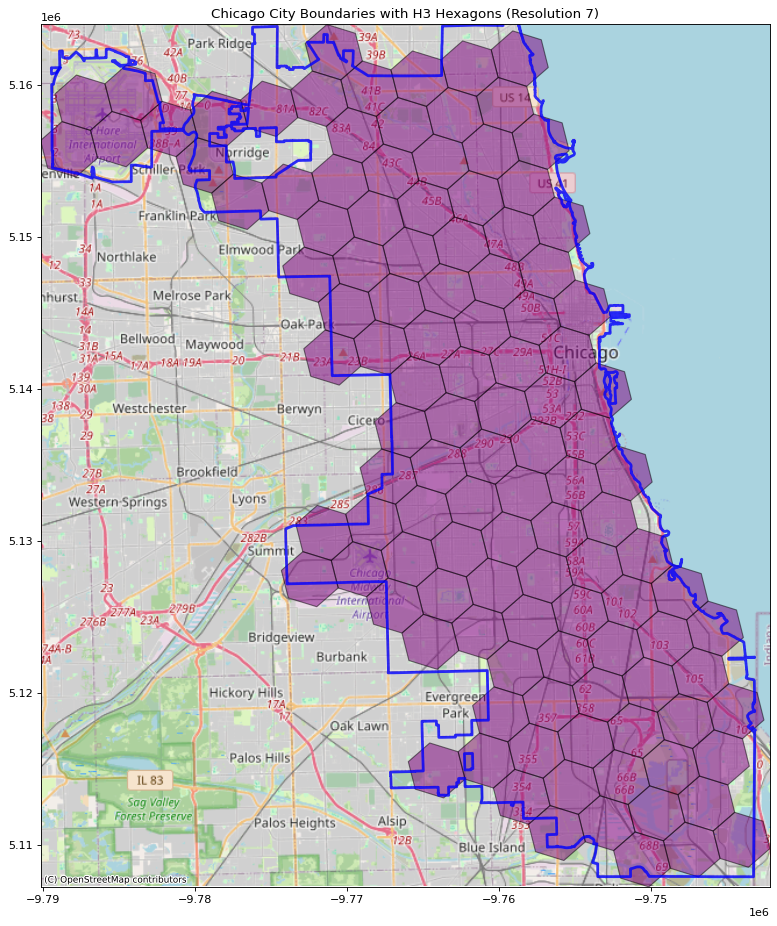

In [8]:
city_bounding_box_json_string = city_geo.to_json()
city_bounding_box_json = json.loads(city_bounding_box_json_string)
city_bounding_box_poly = city_bounding_box_json["features"][0]

# Computing hexagons for a given polygon
polygon_obj = city_bounding_box_poly["geometry"] # your geo json object
hexagons = h3.geo_to_cells(polygon_obj, res = H3_HEXAGON_RESOLUTION)

# Convert H3 hexes to geometry
# Create geometry series first
hex_geometries = [shape(h3.cells_to_geo([h])) for h in hexagons]

# Create GeoDataFrame with geometry from the start
df_boundaries = gpd.GeoDataFrame(
    {"h3_hex_id": list(hexagons)},
    geometry=hex_geometries,
    crs="EPSG:4326"
)

# Convert both to Web Mercator
df_web = df_boundaries.to_crs(3857)
city_bounds = city.to_crs(3857)

fig, ax = plt.subplots(figsize=(14, 14), dpi=80)

# Plot both in the same crs
df_web.plot(ax=ax, facecolor='purple', edgecolor='black', alpha=0.5)
city_bounds.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=2.5, alpha=0.8)

# Set extent from hexes
ax.set_xlim(df_web.total_bounds[0], df_web.total_bounds[2])
ax.set_ylim(df_web.total_bounds[1], df_web.total_bounds[3])

ax.set_title('Chicago City Boundaries with H3 Hexagons (Resolution {})'.format(H3_HEXAGON_RESOLUTION))

# Add basemap
ctx.add_basemap(ax, crs=df_web.crs, source=ctx.providers.OpenStreetMap.Mapnik)

plt.show()
plt.close(fig)

## All Pickups and Dropoffs visualized (Hexagons)

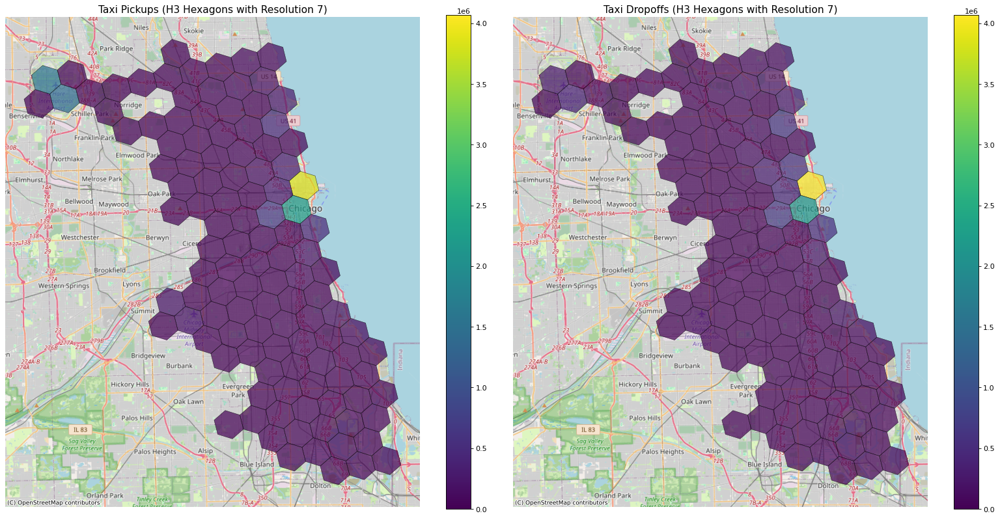

Pickups total: 14203555
Dropoffs total: 13324248


In [9]:
# Create GeoDataFrame for pickups and dropoffs (only needed columns to limit memory)
# trip_end_timestamp is carried on dropoffs so it can be reused later for the
# community-area breakdown, which buckets dropoffs by end time
pickup_cols = ['trip_start_timestamp', 'pickup_centroid_longitude', 'pickup_centroid_latitude']
dropoff_cols = ['trip_start_timestamp', 'trip_end_timestamp', 'dropoff_centroid_longitude', 'dropoff_centroid_latitude']

pickups_gdf = gpd.GeoDataFrame(
    taxi_data[pickup_cols],
    geometry=gpd.points_from_xy(taxi_data['pickup_centroid_longitude'], taxi_data['pickup_centroid_latitude']),
    crs='EPSG:4326'
)

dropoffs_gdf = gpd.GeoDataFrame(
    taxi_data[dropoff_cols],
    geometry=gpd.points_from_xy(taxi_data['dropoff_centroid_longitude'], taxi_data['dropoff_centroid_latitude']),
    crs='EPSG:4326'
)

# Filter to city bounds
pickups_filtered = pickups_gdf.cx[city_geo.total_bounds[0]:city_geo.total_bounds[2],
                                   city_geo.total_bounds[1]:city_geo.total_bounds[3]].copy()
dropoffs_filtered = dropoffs_gdf.cx[city_geo.total_bounds[0]:city_geo.total_bounds[2],
                                     city_geo.total_bounds[1]:city_geo.total_bounds[3]].copy()
del pickups_gdf, dropoffs_gdf

# Assign h3 cells once here -- reused below for both the full-period plot
# and every hourly breakdown, instead of recomputing per time slice
pickups_filtered['h3_hex_id'] = [h3.latlng_to_cell(lat, lon, H3_HEXAGON_RESOLUTION)
                                  for lat, lon in zip(pickups_filtered.geometry.y, pickups_filtered.geometry.x)]
dropoffs_filtered['h3_hex_id'] = [h3.latlng_to_cell(lat, lon, H3_HEXAGON_RESOLUTION)
                                   for lat, lon in zip(dropoffs_filtered.geometry.y, dropoffs_filtered.geometry.x)]

# Count per hexagon
pickups_counts = pickups_filtered.groupby('h3_hex_id').size().reset_index(name='count')
dropoffs_counts = dropoffs_filtered.groupby('h3_hex_id').size().reset_index(name='count')

# Merge with hexagon geometries (df_boundaries already carries crs='EPSG:4326')
pickups_hex = df_boundaries.merge(pickups_counts, on='h3_hex_id', how='left')
pickups_hex['count'] = pickups_hex['count'].fillna(0)

dropoffs_hex = df_boundaries.merge(dropoffs_counts, on='h3_hex_id', how='left')
dropoffs_hex['count'] = dropoffs_hex['count'].fillna(0)

# Plot both
fig, axes = plt.subplots(1, 2, figsize=(20, 10), dpi=80)

pickups_hex_web = pickups_hex.to_crs(epsg=3857)
dropoffs_hex_web = dropoffs_hex.to_crs(epsg=3857)

# Shared 0-to-max scale across both panels so pickup/dropoff colors are directly comparable
vmax_hex = max(pickups_hex_web['count'].max(), dropoffs_hex_web['count'].max())

pickups_hex_web.plot(ax=axes[0], column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax_hex,
                 edgecolor='black', linewidth=0.5, alpha=0.7)
axes[0].set_title('Taxi Pickups (H3 Hexagons with Resolution ' + str(H3_HEXAGON_RESOLUTION) + ')', fontsize=14)
axes[0].axis('off')

dropoffs_hex_web.plot(ax=axes[1], column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax_hex,
                  edgecolor='black', linewidth=0.5, alpha=0.7)
axes[1].set_title('Taxi Dropoffs (H3 Hexagons with Resolution ' + str(H3_HEXAGON_RESOLUTION) + ')', fontsize=14)
axes[1].axis('off')

# Add basemap tiles on top of hexagons
ctx.add_basemap(axes[0], crs=pickups_hex_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
ctx.add_basemap(axes[1], crs=dropoffs_hex_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)

plt.tight_layout()
plt.show()
plt.close(fig)

print("Pickups total:", pickups_filtered.geometry.count())
print("Dropoffs total:", dropoffs_filtered.geometry.count())

### H3 results and interpretation

H3 resolution 7 provides an equal grid for comparing spatial demand volumes. It does not create additional precision: cells are populated from anonymized centroids, and the colors represent raw trip counts rather than area-normalized density. Exact leading cells are listed below; the identifiers are technical grid references, not neighborhood names.

In [ ]:
h3_top_results = pd.concat([pickups_counts.nlargest(10, "count").rename(columns={"h3_hex_id":"Pickup H3 Cell", "count":"Pickup Trips"}).reset_index(drop=True), dropoffs_counts.nlargest(10, "count").rename(columns={"h3_hex_id":"Drop-off H3 Cell", "count":"Drop-off Trips"}).reset_index(drop=True)], axis=1)
h3_top_results.index = range(1, 11); h3_top_results.index.name = "Rank"
print("Top 10 H3 cells by trip count:")
print(h3_top_results.to_string(formatters={"Pickup Trips": lambda x:f"{x:,.0f}", "Drop-off Trips":lambda x:f"{x:,.0f}"}))

Top 10 H3 cells by trip count:
       Pickup H3 Cell Pickup Trips  Drop-off H3 Cell Drop-off Trips
Rank
1      872664c1effffff    3,847,711   872664c1effffff      4,066,453
2      872664c1affffff    2,250,486   872664c1affffff      2,159,843
3      872759343ffffff    1,570,888   872664ca9ffffff        638,656
4      87275934effffff    1,414,520   872664c16ffffff        615,590
5      872664ca9ffffff      622,401   872664c13ffffff        552,103
6      872664c16ffffff      466,859   872664c1bffffff        476,816
7      872664c1bffffff      428,776   872664cadffffff        450,007
8      872664c13ffffff      309,638   87275934effffff        336,141
9      872664cadffffff      291,623   872664cacffffff        332,822
10     872664d89ffffff      240,887   872664d89ffffff        263,395


Cell `872664c1effffff` ranks first for both pickups (3,847,711) and drop-offs (4,066,453). The large gap between the first cells and the rest confirms that trip volume is strongly concentrated.

## Time-dependent visualizattions using Hexagons

### 4-Hourly Pickups

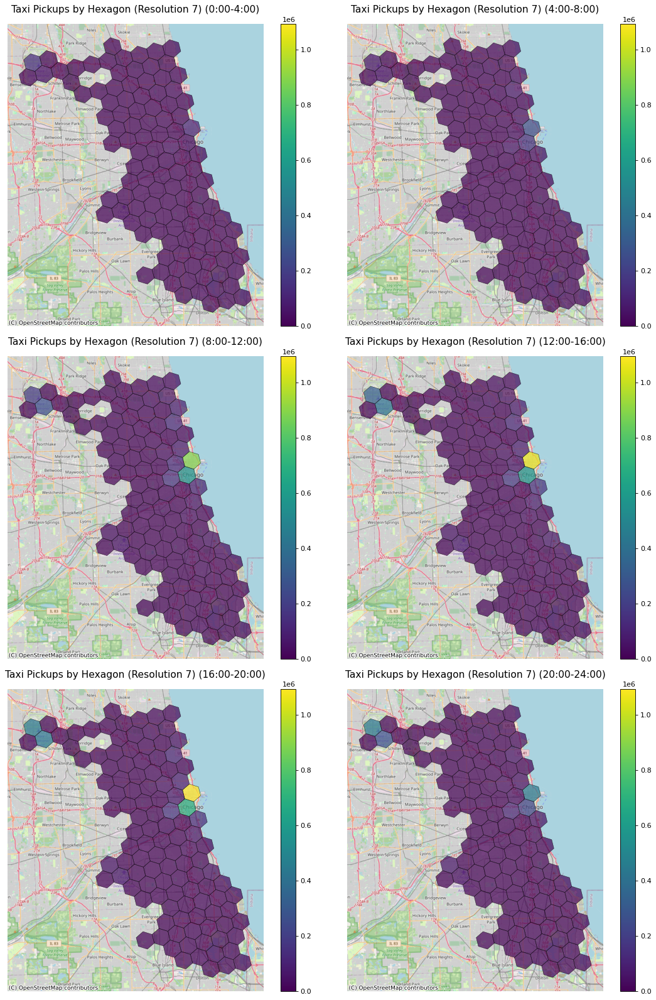

In [10]:
plot_hourly_hex_counts(pickups_filtered, df_boundaries, 'trip_start_timestamp', 'Taxi Pickups')

### 4-Hourly Dropoffs

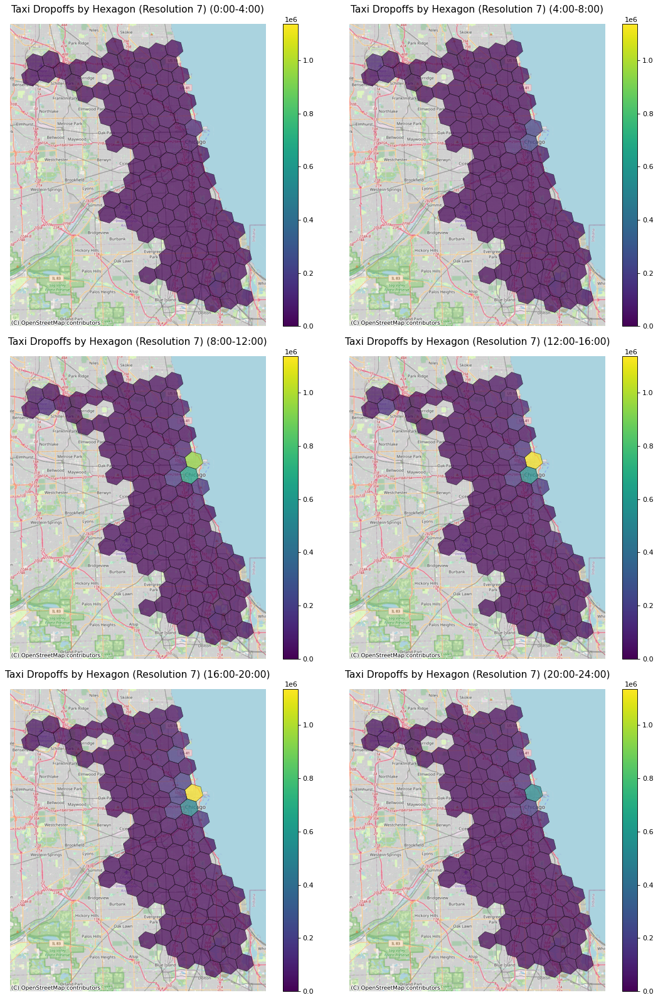

In [11]:
plot_hourly_hex_counts(dropoffs_filtered, df_boundaries, 'trip_start_timestamp', 'Taxi Dropoffs')

### H3 time-block interpretation

Pickup panels represent pickup demand by start time. The existing H3 drop-off call also uses `trip_start_timestamp`; its panels therefore show **destinations of trips starting in each block**, not arrivals grouped by drop-off time. This distinction is documented without changing the original analysis.

In [ ]:
def dominant_hex_by_block(gdf, timestamp_col, label):
    hour=gdf[timestamp_col].dt.hour; rows=[]
    for (start,end), block in zip(TIME_BINS,TIME_LABELS):
        counts=gdf.loc[(hour>=start)&(hour<end)].groupby("h3_hex_id").size(); key=counts.idxmax()
        rows.append({"Time Block":block, f"Top {label} H3 Cell":key, f"{label} Trips":counts.loc[key]})
    return pd.DataFrame(rows)
h3_time_results=dominant_hex_by_block(pickups_filtered,"trip_start_timestamp","Pickup").merge(dominant_hex_by_block(dropoffs_filtered,"trip_start_timestamp","Drop-off Destination"),on="Time Block")
print("Dominant H3 cell in each existing time-block panel:")
print(h3_time_results.to_string(index=False,formatters={"Pickup Trips":lambda x:f"{x:,.0f}","Drop-off Destination Trips":lambda x:f"{x:,.0f}"}))

Dominant H3 cell in each existing time-block panel:
 Time Block Top Pickup H3 Cell Pickup Trips Top Drop-off Destination H3 Cell Drop-off Destination Trips
  0:00-4:00     872759343ffffff      136,666                 872664c1effffff                    100,046
  4:00-8:00     872664c1effffff      257,553                 872664c1affffff                    212,551
 8:00-12:00     872664c1effffff      892,723                 872664c1effffff                    957,183
12:00-16:00     872664c1effffff    1,059,235                 872664c1effffff                  1,125,541
16:00-20:00     872664c1effffff    1,094,085                 872664c1effffff                  1,136,515
20:00-24:00     872664c1effffff      440,997                 872664c1effffff                    534,768


The dominant pickup cell changes overnight: `872759343ffffff` leads from 00:00–04:00, while `872664c1effffff` leads every later block. Its largest pickup volume occurs from 16:00–20:00, consistent with the temporal demand peak.

## Census Tract Plotting

### Separation of city boundaries to census tracts

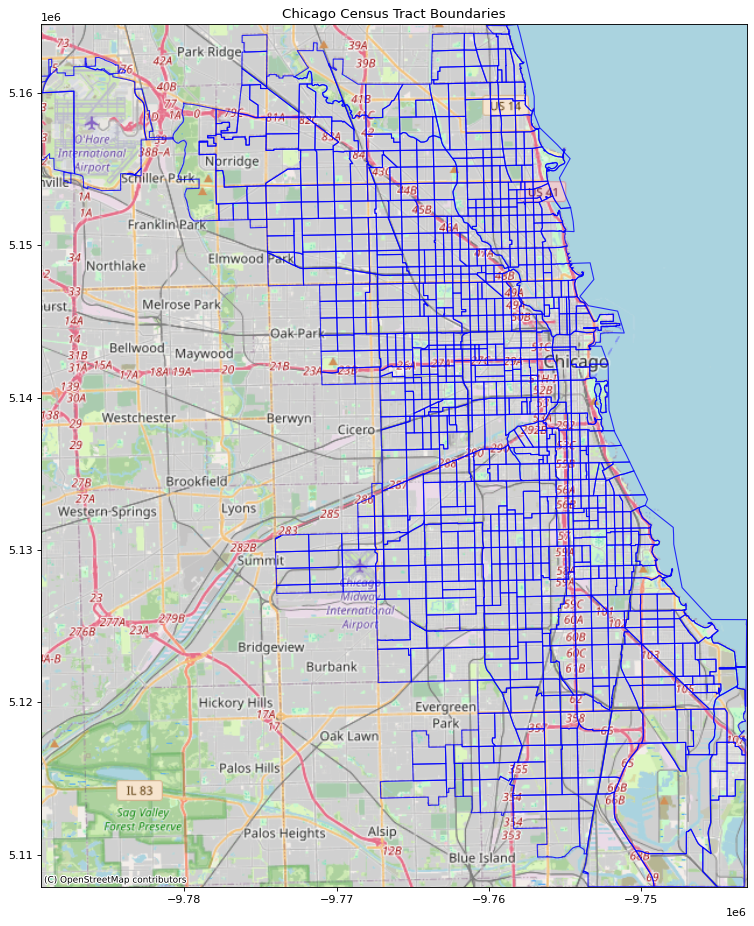

In [12]:
census_tracts = gpd.read_file(CENSUS_TRACT_DATA_PATH)
census_tracts_geo = census_tracts.geometry

fig, ax = plt.subplots(figsize=(14, 14), dpi=80)

# Convert to Web Mercator
census_tracts_bounds = gpd.GeoDataFrame(geometry=census_tracts_geo, crs='EPSG:4326').to_crs(epsg=3857)

# Plot first (so the extent exists)
census_tracts_bounds.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, alpha=0.8)

# Set extent for contextily
ax.set_xlim(census_tracts_bounds.total_bounds[0], census_tracts_bounds.total_bounds[2])
ax.set_ylim(census_tracts_bounds.total_bounds[1], census_tracts_bounds.total_bounds[3])

# Add basemap
ctx.add_basemap(ax, crs=census_tracts_bounds.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title('Chicago Census Tract Boundaries')
plt.show()
plt.close(fig)

## All Pickups and Dropoffs visualized (Census Tracts)

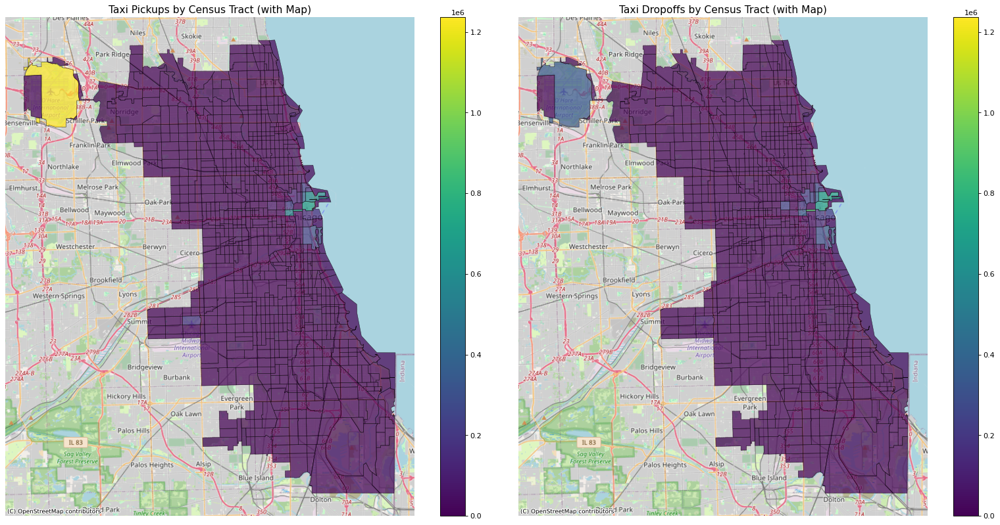

In [13]:
## Pickups and Dropoffs by Census Tract
# Create GeoDataFrame for pickups and dropoffs (only needed columns to limit memory)
pickups_cs_gdf = gpd.GeoDataFrame(
    taxi_data_cs[['trip_start_timestamp', 'pickup_centroid_longitude', 'pickup_centroid_latitude']],
    geometry=gpd.points_from_xy(taxi_data_cs['pickup_centroid_longitude'], taxi_data_cs['pickup_centroid_latitude']),
    crs='EPSG:4326'
)

dropoffs_cs_gdf = gpd.GeoDataFrame(
    taxi_data_cs[['trip_end_timestamp', 'dropoff_centroid_longitude', 'dropoff_centroid_latitude']],
    geometry=gpd.points_from_xy(taxi_data_cs['dropoff_centroid_longitude'], taxi_data_cs['dropoff_centroid_latitude']),
    crs='EPSG:4326'
)

# Filter to city bounds
pickups_filtered_cs = pickups_cs_gdf.cx[city_geo.total_bounds[0]:city_geo.total_bounds[2],
                                       city_geo.total_bounds[1]:city_geo.total_bounds[3]]
dropoffs_filtered_cs = dropoffs_cs_gdf.cx[city_geo.total_bounds[0]:city_geo.total_bounds[2],
                                         city_geo.total_bounds[1]:city_geo.total_bounds[3]]
del pickups_cs_gdf, dropoffs_cs_gdf

# Count pickups and dropoffs per census tract using spatial join
pickups_by_tract = gpd.sjoin(pickups_filtered_cs, census_tracts, how='left', predicate='within')
dropoffs_by_tract = gpd.sjoin(dropoffs_filtered_cs, census_tracts, how='left', predicate='within')

# Count records per tract (using the index from census_tracts)
pickups_counts_tract = pickups_by_tract.groupby('index_right').size().reset_index(name='count')
dropoffs_counts_tract = dropoffs_by_tract.groupby('index_right').size().reset_index(name='count')

# Merge counts with census tract geometries
pickups_tracts = census_tracts.reset_index().merge(pickups_counts_tract, left_on='index', right_on='index_right', how='left')
dropoffs_tracts = census_tracts.reset_index().merge(dropoffs_counts_tract, left_on='index', right_on='index_right', how='left')

pickups_tracts['count'] = pickups_tracts['count'].fillna(0)
dropoffs_tracts['count'] = dropoffs_tracts['count'].fillna(0)

## Census Tract Heatmaps with Basemap

# Convert to Web Mercator for mapping
pickups_tracts_web = pickups_tracts.to_crs(epsg=3857)
dropoffs_tracts_web = dropoffs_tracts.to_crs(epsg=3857)

fig, axes = plt.subplots(1, 2, figsize=(20, 10), dpi=80)

# Shared 0-to-max scale across both panels so pickup/dropoff colors are directly comparable
vmax_tract = max(pickups_tracts_web['count'].max(), dropoffs_tracts_web['count'].max())

# Plot pickups
pickups_tracts_web.plot(ax=axes[0], column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax_tract,
                        edgecolor='black', linewidth=0.5, alpha=0.7, zorder=1)
ctx.add_basemap(axes[0], crs=pickups_tracts_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
axes[0].set_title('Taxi Pickups by Census Tract (with Map)', fontsize=14)
axes[0].axis('off')

# Plot dropoffs
dropoffs_tracts_web.plot(ax=axes[1], column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax_tract,
                         edgecolor='black', linewidth=0.5, alpha=0.7, zorder=1)
ctx.add_basemap(axes[1], crs=dropoffs_tracts_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
axes[1].set_title('Taxi Dropoffs by Census Tract (with Map)', fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()
plt.close(fig)

### Census-tract results and interpretation

Census Tracts offer the finest administrative view here, but these maps use only 6,245,422 trips (43.17%) because the existing notebook requires both tract identifiers. The table uses the full 11-digit tract identifier (`census_t_1`).

In [ ]:
def top_tract(counts,label):
    return census_tracts.reset_index()[["index","census_t_1"]].merge(counts,left_on="index",right_on="index_right")[["census_t_1","count"]].nlargest(10,"count").rename(columns={"census_t_1":f"{label} Census Tract","count":f"{label} Trips"}).reset_index(drop=True)
tract_top_results=pd.concat([top_tract(pickups_counts_tract,"Pickup"),top_tract(dropoffs_counts_tract,"Drop-off")],axis=1);tract_top_results.index=range(1,11);tract_top_results.index.name="Rank"
print("Top 10 census tracts by trip count:")
print(tract_top_results.to_string(formatters={"Pickup Trips":lambda x:f"{x:,.0f}","Drop-off Trips":lambda x:f"{x:,.0f}"}))

Top 10 census tracts by trip count:
     Pickup Census Tract Pickup Trips Drop-off Census Tract Drop-off Trips
Rank
1             17031760900    1,236,325            17031320300        880,846
2             17031320300      694,222            17031081400        676,725
3             17031320100      678,470            17031320100        674,008
4             17031081400      585,819            17031081500        376,056
5             17031281900      541,376            17031281900        344,727
6             17031081500      374,379            17031760900        333,928
7             17031330100      242,998            17031330100        286,826
8             17031081200      224,897            17031081200        269,175
9             17031280100      223,621            17031081700        239,634
10            17031561200      176,766            17031280300        233,860


Tract `17031760900` is the strongest pickup tract, while `17031320300` is the strongest drop-off tract. Origins and destinations therefore cannot be treated as spatially identical.

## Time-dependent visualizations on Census-Tract Level

### 4-hourly pickups

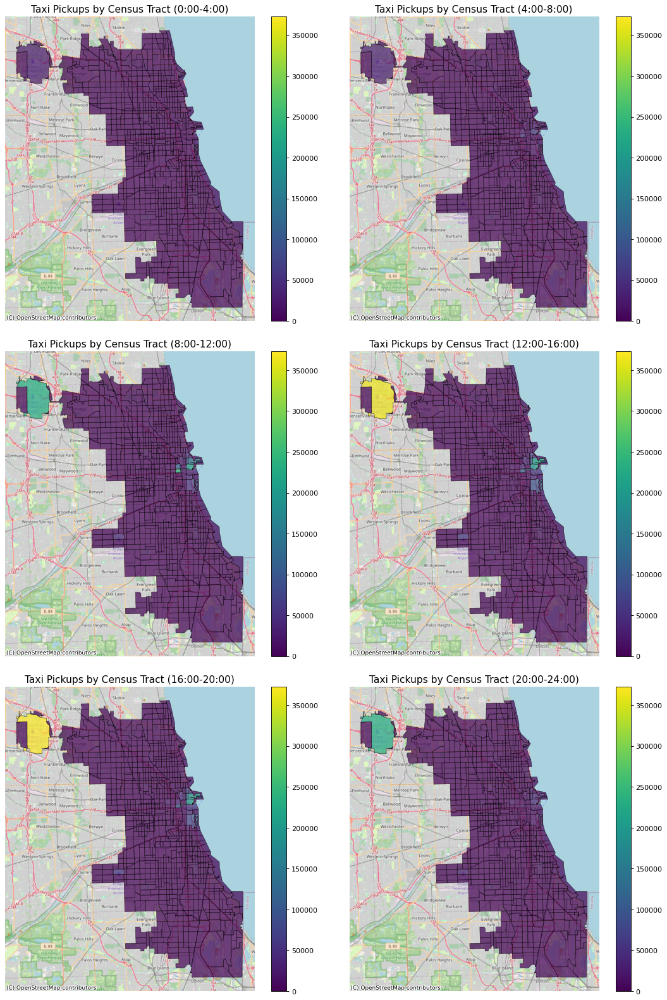

In [14]:
plot_hourly_join_counts(pickups_by_tract, census_tracts, 'trip_start_timestamp', 'Taxi Pickups', 'Census Tract')

### 4-hourly dropoffs

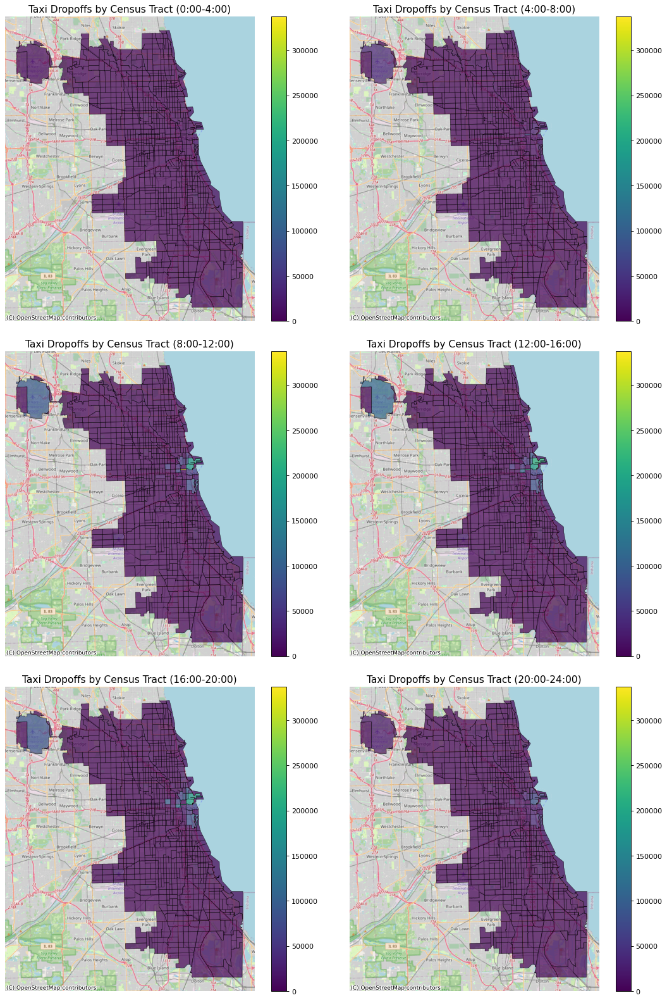

In [15]:
plot_hourly_join_counts(dropoffs_by_tract, census_tracts, 'trip_end_timestamp', 'Taxi Dropoffs', 'Census Tract')

### Census-tract time-block results

These drop-off panels use `trip_end_timestamp` and therefore represent actual arrival-time blocks. The leading tracts change across the day.

In [ ]:
def dominant_join_area(gdf,boundaries,timestamp_col,id_col,label):
    hour=gdf[timestamp_col].dt.hour; ids=boundaries.reset_index()[["index",id_col]]; rows=[]
    for (start,end),block in zip(TIME_BINS,TIME_LABELS):
        counts=gdf.loc[(hour>=start)&(hour<end)].groupby("index_right").size(); key=counts.idxmax(); value=ids.loc[ids["index"]==key,id_col].iloc[0]
        rows.append({"Time Block":block,f"Top {label}":value,f"{label} Trips":counts.loc[key]})
    return pd.DataFrame(rows)
tract_time_results=dominant_join_area(pickups_by_tract,census_tracts,"trip_start_timestamp","census_t_1","Pickup Tract").merge(dominant_join_area(dropoffs_by_tract,census_tracts,"trip_end_timestamp","census_t_1","Drop-off Tract"),on="Time Block")
print("Dominant census tract by four-hour block:")
print(tract_time_results.to_string(index=False,formatters={"Pickup Tract Trips":lambda x:f"{x:,.0f}","Drop-off Tract Trips":lambda x:f"{x:,.0f}"}))

Dominant census tract by four-hour block:
 Time Block Top Pickup Tract Pickup Tract Trips Top Drop-off Tract Drop-off Tract Trips
  0:00-4:00      17031760900             21,067        17031320100               8,419
  4:00-8:00      17031281900             62,167        17031320300              76,787
 8:00-12:00      17031281900            241,016        17031320300             337,467
12:00-16:00      17031760900            364,533        17031081400             214,051
16:00-20:00      17031760900            372,909        17031320100             194,890
20:00-24:00      17031760900            226,333        17031320100              83,987


Morning pickups are led by tract `17031281900`; after noon, `17031760900` dominates. Drop-off leadership changes more frequently, further demonstrating different origin and destination structures.

# Community Area plotting

### Separation of city boundaries to community areas

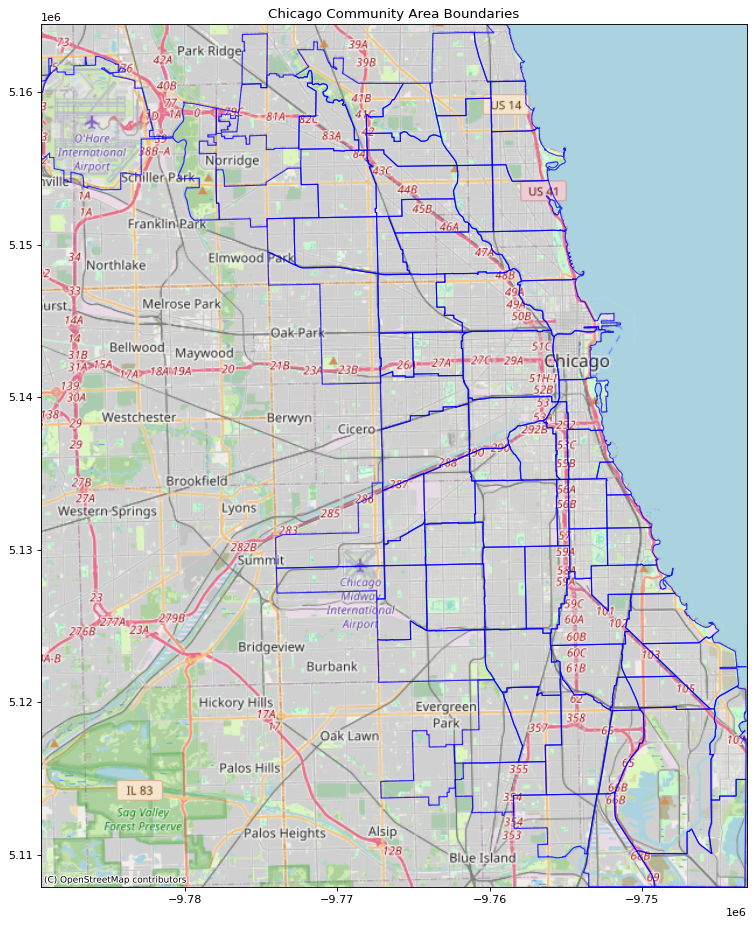

In [16]:
community_areas = gpd.read_file(COMMUNITY_AREA_DATA_PATH)
community_areas_geo = community_areas.geometry

fig, ax = plt.subplots(figsize=(14, 14), dpi=80)

# Convert to Web Mercator
community_areas_bounds = gpd.GeoDataFrame(geometry=community_areas_geo, crs='EPSG:4326').to_crs(epsg=3857)

# Plot first (so the extent exists)
community_areas_bounds.plot(ax=ax, facecolor='none', edgecolor='blue', linewidth=1, alpha=0.8)

# Set extent for contextily
ax.set_xlim(community_areas_bounds.total_bounds[0], community_areas_bounds.total_bounds[2])
ax.set_ylim(community_areas_bounds.total_bounds[1], community_areas_bounds.total_bounds[3])

# Add basemap
ctx.add_basemap(ax, crs=community_areas_bounds.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title('Chicago Community Area Boundaries')
plt.show()
plt.close(fig)

## All pickups and dropoffs visualized (community areas)

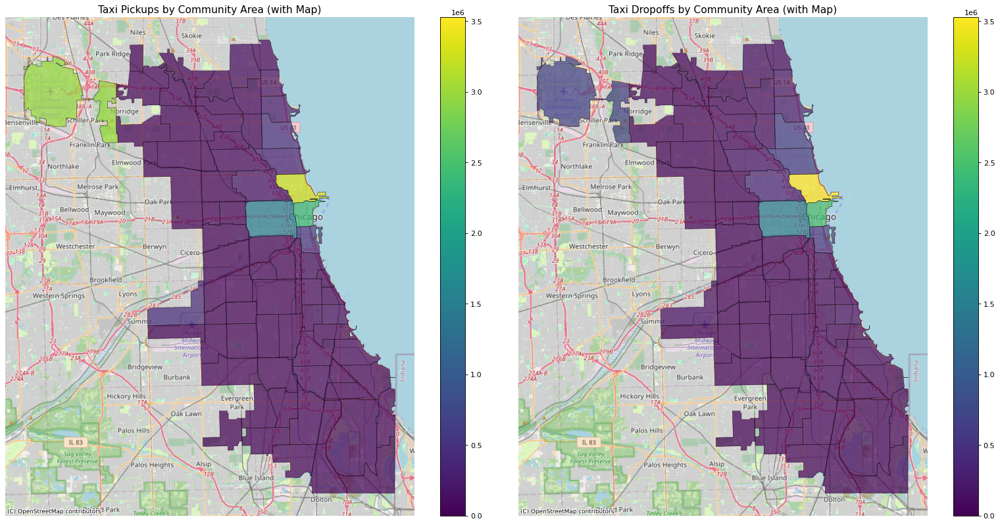

In [17]:
# Reuse pickups_filtered/dropoffs_filtered built earlier (cell above the H3
# hexagon section) -- same source data and city-bounds filter, no need to
# rebuild the GeoDataFrames from scratch again

# Count pickups and dropoffs per community area using spatial join
pickups_by_ca = gpd.sjoin(pickups_filtered, community_areas, how='left', predicate='within')
dropoffs_by_ca = gpd.sjoin(dropoffs_filtered, community_areas, how='left', predicate='within')

# Count records per tract (using the index from community_areas)
pickups_counts_ca = pickups_by_ca.groupby('index_right').size().reset_index(name='count')
dropoffs_counts_ca = dropoffs_by_ca.groupby('index_right').size().reset_index(name='count')

# Merge counts with community area geometries
pickups_ca = community_areas.reset_index().merge(pickups_counts_ca, left_on='index', right_on='index_right', how='left')
dropoffs_ca = community_areas.reset_index().merge(dropoffs_counts_ca, left_on='index', right_on='index_right', how='left')

pickups_ca['count'] = pickups_ca['count'].fillna(0)
dropoffs_ca['count'] = dropoffs_ca['count'].fillna(0)

## Community Area Heatmaps with Basemap

# Convert to Web Mercator for mapping
pickups_ca_web = pickups_ca.to_crs(epsg=3857)
dropoffs_ca_web = dropoffs_ca.to_crs(epsg=3857)

fig, axes = plt.subplots(1, 2, figsize=(20, 10), dpi=80)

# Shared 0-to-max scale across both panels so pickup/dropoff colors are directly comparable
vmax_ca = max(pickups_ca_web['count'].max(), dropoffs_ca_web['count'].max())

# Plot pickups
pickups_ca_web.plot(ax=axes[0], column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax_ca,
                    edgecolor='black', linewidth=0.5, alpha=0.7, zorder=1)
ctx.add_basemap(axes[0], crs=pickups_ca_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
axes[0].set_title('Taxi Pickups by Community Area (with Map)', fontsize=14)
axes[0].axis('off')

# Plot dropoffs
dropoffs_ca_web.plot(ax=axes[1], column='count', cmap='viridis', legend=True, vmin=0, vmax=vmax_ca,
                         edgecolor='black', linewidth=0.5, alpha=0.7, zorder=1)
ctx.add_basemap(axes[1], crs=dropoffs_ca_web.crs, source=ctx.providers.OpenStreetMap.Mapnik, zorder=0)
axes[1].set_title('Taxi Dropoffs by Community Area (with Map)', fontsize=14)
axes[1].axis('off')

plt.tight_layout()
plt.show()
plt.close(fig)

### Community-area results and interpretation

Community Areas are the most interpretable operational level because they provide 77 recognizable zones. The maps show raw demand volume, not trips per square kilometre or per resident.

In [ ]:
def top_community(counts,label):
    return community_areas.reset_index()[["index","area_numbe","community"]].merge(counts,left_on="index",right_on="index_right")[["area_numbe","community","count"]].nlargest(10,"count").rename(columns={"area_numbe":f"{label} Area ID","community":f"{label} Community Area","count":f"{label} Trips"}).reset_index(drop=True)
community_top_results=pd.concat([top_community(pickups_counts_ca,"Pickup"),top_community(dropoffs_counts_ca,"Drop-off")],axis=1);community_top_results.index=range(1,11);community_top_results.index.name="Rank"
print("Top 10 community areas by trip count:")
print(community_top_results.to_string(formatters={"Pickup Trips":lambda x:f"{x:,.0f}","Drop-off Trips":lambda x:f"{x:,.0f}"}))

Top 10 community areas by trip count:
     Pickup Area ID Pickup Community Area Pickup Trips Drop-off Area ID Drop-off Community Area Drop-off Trips
Rank
1                 8       NEAR NORTH SIDE    3,264,625                8          NEAR NORTH SIDE      3,528,594
2                76                  OHARE    2,985,521               32                     LOOP      2,452,298
3                32                   LOOP    2,374,677               28           NEAR WEST SIDE      1,450,354
4                28         NEAR WEST SIDE    1,467,354                6                LAKE VIEW        648,761
5                33        NEAR SOUTH SIDE      505,904                7             LINCOLN PARK        595,070
6                 6              LAKE VIEW      494,858               76                    OHARE        579,319
7                56        GARFIELD RIDGE      405,005               33          NEAR SOUTH SIDE        563,556
8                 7           LINCOLN PARK      325,746  

Near North Side leads pickups (3,264,625) and drop-offs (3,528,594). O'Hare shows the strongest directional imbalance: it ranks second for pickups with 2,985,521 trips but only sixth for drop-offs with 579,319.

## Time-dependent visualizations on Community Area Level

### 4-hourly pickups

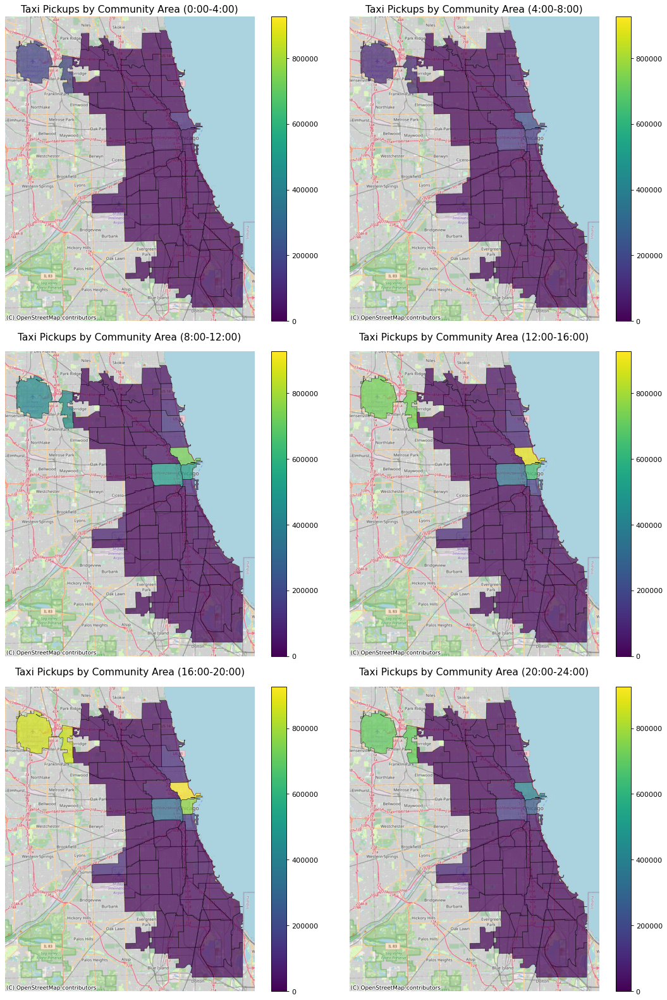

In [18]:
plot_hourly_join_counts(pickups_by_ca, community_areas, 'trip_start_timestamp', 'Taxi Pickups', 'Community Area')

### 4-hourly dropoffs

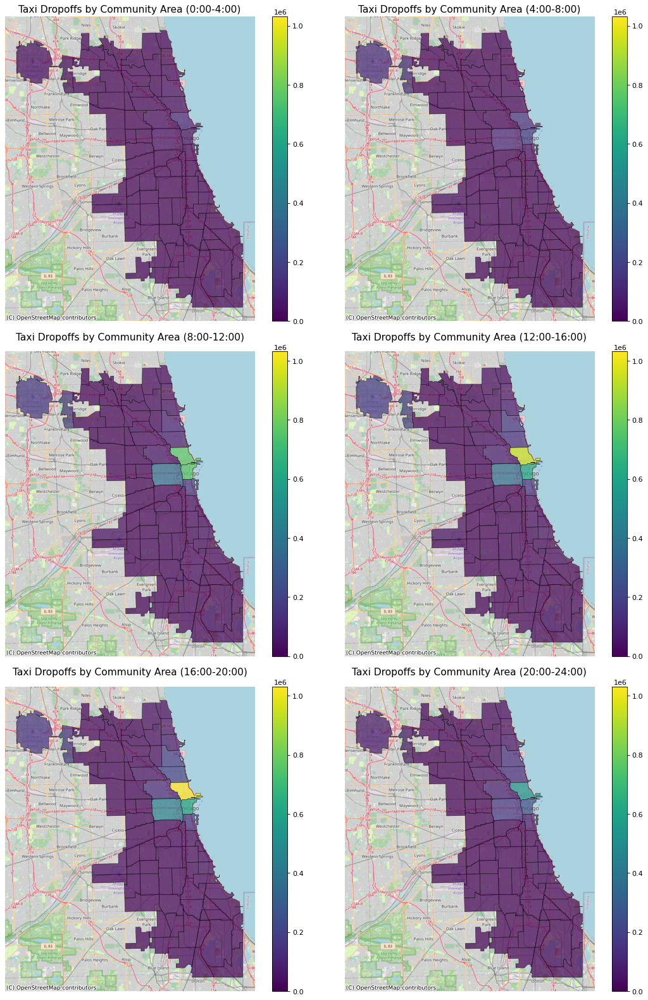

In [19]:
plot_hourly_join_counts(dropoffs_by_ca, community_areas, 'trip_end_timestamp', 'Taxi Dropoffs', 'Community Area')

### Community-area time-block results

This table translates the maps into named operational zones. Pickups use trip start time and drop-offs use trip end time.

In [ ]:
ca_time_results=dominant_join_area(pickups_by_ca,community_areas,"trip_start_timestamp","community","Pickup Area").merge(dominant_join_area(dropoffs_by_ca,community_areas,"trip_end_timestamp","community","Drop-off Area"),on="Time Block")
print("Dominant community area by four-hour block:")
print(ca_time_results.to_string(index=False,formatters={"Pickup Area Trips":lambda x:f"{x:,.0f}","Drop-off Area Trips":lambda x:f"{x:,.0f}"}))

Dominant community area by four-hour block:
 Time Block Top Pickup Area Pickup Area Trips Top Drop-off Area Drop-off Area Trips
  0:00-4:00           OHARE           168,417    NEAR NORTH SIDE              107,260
  4:00-8:00 NEAR NORTH SIDE           210,845               LOOP              180,906
 8:00-12:00 NEAR NORTH SIDE           731,045    NEAR NORTH SIDE              763,901
12:00-16:00 NEAR NORTH SIDE           894,316    NEAR NORTH SIDE              945,428
16:00-20:00 NEAR NORTH SIDE           926,865    NEAR NORTH SIDE            1,031,329
20:00-24:00           OHARE           703,740    NEAR NORTH SIDE              529,528


Near North Side dominates pickups from 04:00–20:00 and drop-offs in four of six blocks. O'Hare leads pickups overnight and from 20:00–24:00, while the Loop leads drop-offs from 04:00–08:00. This supports time-dependent vehicle positioning rather than one static spatial allocation.

# Results and Key Takeaways

- **Spatial coverage differs by level.** Coordinates are available for 14,203,555 pickups (98.19%) and 13,324,248 drop-offs (92.11%). Census Tract maps use only 6,245,422 trips (43.17%) because the existing notebook requires both tract identifiers.
- **Apparent point precision is limited.** More than 14 million trips collapse to 573 pickup and 687 drop-off coordinate pairs. These are reporting centroids, not exact street locations.
- **Demand is strongly concentrated.** H3 cell `872664c1effffff` contains the most pickups (3,847,711) and drop-offs (4,066,453).
- **Community Areas provide the clearest operational result.** Near North Side leads pickups (3,264,625) and drop-offs (3,528,594). O'Hare has 2,985,521 pickups but only 579,319 drop-offs.
- **Demand shifts over the day.** Near North Side leads pickups from 04:00–20:00; O'Hare leads from 00:00–04:00 and 20:00–24:00. Near North Side leads most drop-off blocks, with the Loop leading from 04:00–08:00.
- **Origins and destinations require separate treatment.** Their leading Census Tracts and Community Areas differ substantially.
- **Each spatial level has a different role.** H3 provides an equal grid, Census Tracts provide fine detail on a restricted subset, and Community Areas provide the most interpretable fleet-planning zones.

**Interpretation limits.** Values are raw trip counts, not population- or area-normalized rates. Coordinates are anonymized centroids. Existing H3 drop-off panels group destinations by trip start time, while Census Tract and Community Area drop-off panels use trip end time; direct temporal comparisons must respect that distinction.